# **Medical Imaging Tutorial: MRI modality classification in Brain Tumor images**
**Authors: Diedre, Gustavo, Livia**





# **Setup**
Usually, it is recommended to use updated versions of PyTorch and Pytorch-Lightning, as they are under constant development. Before upgrading, it is recommended to check the libraries changelog for changes that may eventually break your code.

* https://github.com/PyTorchLightning/pytorch-lightning/releases
* https://github.com/pytorch/pytorch/releases





## Installing dependencies

In [ ]:
# Install required libraries
!pip install pytorch-lightning SimpleITK==2.0.2 albumentations efficientnet_pytorch torchinfo torchmetrics --quiet

## Imports

In [ ]:
import os
import cv2
import json
import imageio
import albumentations as A
import random
import torchinfo
import numpy as np
import nibabel as nib
import SimpleITK as sitk
import multiprocessing as mp
import matplotlib.pyplot as plt
from collections import Counter
from glob import iglob, glob
from tqdm import tqdm
from argparse import Namespace
from torch import nn, Tensor
from torch.utils.data import Dataset, DataLoader
from torch.nn import functional as F
from torch.optim import AdamW
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torchvision.transforms import Compose
from typing import Tuple, List, Dict
from pytorch_lightning import LightningDataModule
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import NeptuneLogger
from efficientnet_pytorch import EfficientNet
from torch import nn
from torchmetrics import Accuracy
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from pyeer.eer_info import get_eer_stats

from matplotlib import pyplot as plt

%load_ext tensorboard

In [ ]:
# Check libraries version!
import torch
import pytorch_lightning as pl

print(f"PyTorch version: {torch.__version__}")
print(f"Pytorch Lightning version: {pl.__version__}")

PyTorch version: 1.12.0+cu113
Pytorch Lightning version: 1.6.5


# **Data**

The first step is to read the raw data and create pre processing data.

## Downloading raw data
We will use a small subset of a brain tumour dataset from the Medical Segmentation Decatlhon (http://medicaldecathlon.com/).

Notice you could use way more data for a better model, but we will keep it small in the interest of training time.

In [ ]:
if not os.path.exists("brats.zip"):
    !wget https://github.com/MICLab-Unicamp/Public-data/releases/download/v1.1/brats.zip

## Unpacking data
Here we define where our raw and preprocessed data will be and unpack the downloaded .zip in the raw folder.

In [ ]:
RAW_DATA_FOLDER = "raw"
PROCESSED_DATA_FOLDER = "preprocessed"
os.makedirs(PROCESSED_DATA_FOLDER, exist_ok=True)
os.makedirs(RAW_DATA_FOLDER, exist_ok=True)

!unzip brats.zip -d $RAW_DATA_FOLDER

Archive:  brats.zip
replace raw/labels/BRATS_003.nii.gz? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


### Dataset Class for 3D images

> The first step of a project is data curation. Here, it is important to see your data and perform the necessary pre processing



In [ ]:
class RawMRIDataset(Dataset):
    # Every 3D exam has the following modalities:
    MODALITY = ["FLAIR", "T1w", "T1gd", "T2w"]
    def __init__(self, mode, transform=None):
        '''
        Initialize image index and save transform method
        '''
        super().__init__()
        self.transform = transform
        self.mris = sorted(glob(os.path.join(RAW_DATA_FOLDER, mode, "*.nii.gz")))

    def __len__(self):
        '''
        Return how many images there are
        '''
        return len(self.mris)

    def __getitem__(self, i):
        '''
        Load, transform and return item 'i' of dataset
        Each image has 4 modalities present in channels following the
        RawMRIDataset.MODALITY variable.
        '''
        mri_path = self.mris[i]
        ID = os.path.basename(mri_path).replace(".nii.gz", '')

        # Read image
        mri = sitk.GetArrayFromImage(sitk.ReadImage(mri_path))

        if self.transform is not None:
            mri = self.transform(mri)

        metadata = {"mri_path": mri_path, "image_ID": ID}

        return mri, metadata


## Debugging RAW data

Here, it is important to visualize your data, its shape, min and max values. Also it is recommended to check the files name list, to be sure you are using the right files.

In [ ]:
# Transforms used in pre-processing

# Data intensity normalization
class MinMaxNormalize():
    def __call__(self, x: np.ndarray):
        return (x - x.min()) / (x.max() - x.min())

In [ ]:
# Set the applied transforms to "None" if you want to visualize Raw data.

transform =  MinMaxNormalize()

debug_train = RawMRIDataset("train", transform=transform)
debug_val = RawMRIDataset("val", transform=transform)
debug_test = RawMRIDataset("test", transform=transform)

len(debug_train), len(debug_val), len(debug_test)

(4, 1, 1)

{'mri_path': 'raw/train/BRATS_004.nii.gz', 'image_ID': 'BRATS_004'}
(4, 155, 240, 240)
1.0 0.0


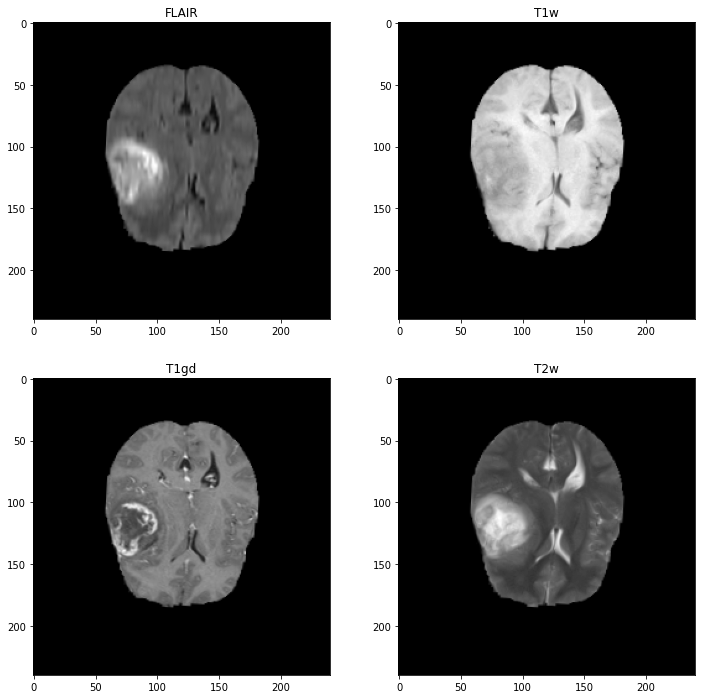

In [ ]:
# Visualize data
random_mri, metadata = random.choice(debug_train)
print(metadata)
print(random_mri.shape)
print(random_mri.max(), random_mri.min())

mid_slice = random_mri.shape[1]//2

plt.figure(figsize=(12, 12))
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.title(RawMRIDataset.MODALITY[i])
    plt.imshow(random_mri[i, mid_slice], cmap="gray")
plt.show()

In [ ]:
# Visualize data list
debug_train.mris, debug_val.mris, debug_test.mris

(['raw/train/BRATS_001.nii.gz',
  'raw/train/BRATS_002.nii.gz',
  'raw/train/BRATS_003.nii.gz',
  'raw/train/BRATS_004.nii.gz'],
 ['raw/val/BRATS_005.nii.gz'],
 ['raw/test/BRATS_006.nii.gz'])

## Preprocessing and Saving images as  2D data
Preprocessing is one of the most important parts of the workflow. Here you will perform tasks that can be performed only once and stored on storage, such as extracting slices from the volumes.

Pay attention to never split slices from the same scan into training and validation for example. This is where our 3D dataset comes in handy for extracting and saving slices.

In [ ]:
def preprocess():
    '''
    Initialize 3D datasets and save npz 2D slices in preprocessed folder, also save the label!

    ATTENTION: We are skipping completely empty slices, using slices only from the axial orientation.
    '''
    transform = MinMaxNormalize()

    for mode in ["train", "val", "test"]:
        os.makedirs(os.path.join(PROCESSED_DATA_FOLDER, mode), exist_ok=True)
        raw_data = RawMRIDataset(mode, transform=transform)

        for img, metadata in tqdm(raw_data, leave=True, position=0, desc=f"Preprocessing {mode}..."):
            ID = metadata["image_ID"]

            # Iterate over modalities
            for modality in range(4):
                # Iterate over slices
                for i, img_slice in enumerate(img[modality]):
                    # Make sure dimensions are correct (2D slice)
                    assert len(img_slice.shape) == 2

                    # Check if slice is using more than 10% of the area to avoid empty slices
                    image_area = img_slice.shape[0]*img_slice.shape[1]
                    if (img_slice > 0).sum() > image_area*0.1:
                        # Save slice encoding scan ID, modality and slice number in the name
                        save_path = os.path.join(PROCESSED_DATA_FOLDER, mode, f"{ID}_{modality}_{i}.npz")
                        np.savez_compressed(save_path, img=img_slice, label=modality)

    with open(os.path.join(PROCESSED_DATA_FOLDER, "done.txt"), 'w') as done_file:
        done_file.write("Done.")


OVERWRITE_PREPROCESS = True
if OVERWRITE_PREPROCESS:
    !rm -rfd preprocessed
if not os.path.exists(os.path.join(PROCESSED_DATA_FOLDER, "done.txt") or OVERWRITE_PREPROCESS):
    preprocess()
else:
    print(f"Preprocessed data already present. If you want to re-run preprocessing, delete the contents of the {PROCESSED_DATA_FOLDER} folder or set OVERWRITE_PREPROCESS to True.")

Preprocessing test...: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


## Dataset class for training
This class will read the preprocessed data and deliver it to the training network.

In [ ]:
class MRIDataset(Dataset):
    def __init__(self, mode, transform=None):
        self.dataset = glob(os.path.join(PROCESSED_DATA_FOLDER, mode, "*.npz"))
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, i):
        npz_path = self.dataset[i]
        npz = np.load(npz_path)
        img, tgt = npz["img"].astype(np.float32).squeeze(), npz["label"].item()

        if self.transform is not None:
            transformed = self.transform(image=img)
            img = transformed["image"]

        img = torch.from_numpy(img).float().unsqueeze(0)

        return img, tgt


### Checking number of slices



In [ ]:
{mode: len(MRIDataset(mode)) for mode in ["train", "val", "test"]}

{'test': 408, 'train': 1655, 'val': 428}

### Data Augmentation

Example of data augmentation using Albumentations.
The augmentation will vary accorging to your needs, this is a simple example of a random crop and using a fixed slice size of 240.

In [ ]:
def get_transform(transform_str):
    '''
    Factory de objetos de transformadas
    '''
    if transform_str == "crop":
        transform = A.Compose([A.Resize(240, 240),
                               A.RandomCrop(width=160, height=160)])
    elif transform_str == "val_240":
        transform = A.Resize(240, 240)
    else:
        transform = None

    return transform

## Dataloader debug

Check if the images are correct after pre processing and data augmentation

torch.Size([1, 240, 240])
Slice Modality: T1w


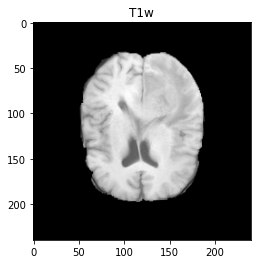

torch.Size([1, 160, 160])
Slice Modality: T2w


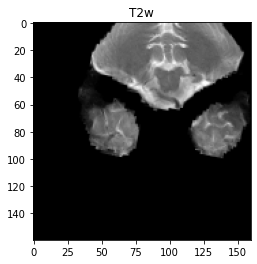

In [ ]:
# Random image without random crop
debug_transform = get_transform("val_240")
img, tgt = random.choice(MRIDataset(random.choice(["train", "val", "test"]), transform=debug_transform))
slice_modality = RawMRIDataset.MODALITY[tgt]
print(img.shape)
print(f"Slice Modality: {slice_modality}")
plt.figure()
plt.title(slice_modality)
plt.imshow(img.squeeze(), cmap="gray")
plt.show()

# Random image with random crop
debug_transform = get_transform("crop")
img, tgt = random.choice(MRIDataset(random.choice(["train", "val", "test"]), transform=debug_transform))
slice_modality = RawMRIDataset.MODALITY[tgt]
print(img.shape)
print(f"Slice Modality: {slice_modality}")

plt.figure()
plt.title(slice_modality)
plt.imshow(img.squeeze(), cmap="gray")

plt.show()

In [ ]:
# Load all dataset items before training, to prevent errors during training
for mode in ["train", "val", "test"]:
    for _ in tqdm(MRIDataset(mode), leave=True, position=0, desc=f"{mode} Load testing..."):
        pass

test Load testing...: 100%|██████████| 408/408 [00:00<00:00, 610.56it/s]


# **Training**

### Hyperparameters

Set a hyperparameters dictionary to organize your code and avoide "magic numbers". You can experiment with these parameters later if you want!

In [ ]:
hparams = {"experiment_name": "MICTutorial Classification Baseline Pretrained",  # experiment name identifies the run for later
           "train_transform_str": "crop",  # a string representing what transformations were done in training
           "eval_transform_str": "val_240",  # a string representing what transformations were done in validation
           "max_epochs": 50,  # number of epochs to train
           "batch_size": 32,  # size of batch
           "model_name": "efficientnet-b0",  # name of the efficientnet model we will use
           "pretrained": True,  # load an efficientnet pre trained on imagenet?
           "nworkers": mp.cpu_count(),   # number of workers to use in parallel loading
           "nout": 4,  # number of classes
           "nin": 1,  # number of channels of the input image
           "lr": 1e-4,  # learning rate
           "wd": 1e-5,  # weight decay for optimizer
           "cpu": False,  # forces using the CPU
           }


for k, v in hparams.items():
    print(f"{k}: {v}")

experiment_name: MICTutorial Classification Baseline Pretrained
train_transform_str: crop
eval_transform_str: val_240
max_epochs: 50
batch_size: 32
model_name: efficientnet-b0
pretrained: True
nworkers: 2
nout: 4
nin: 1
lr: 0.0001
wd: 1e-05
cpu: False


## Datamodule

Here, we use Pytorch Lightning datamodule class to organize dataloaders and the data

In [ ]:
class MRIDataModule(pl.LightningDataModule):
    def __init__(self, hparams):
        super().__init__()
        self.save_hyperparameters(hparams)

    def setup(self, stage=None):
        '''
        Here is where data is initialized using the MRIDataset class, which reads the preprocessed slices
        '''
        train_transform = get_transform(self.hparams.train_transform_str)
        eval_transform = get_transform(self.hparams.eval_transform_str)

        self.train = MRIDataset("train", transform=train_transform)
        self.val = MRIDataset("val", transform=eval_transform)
        self.test = MRIDataset("test", transform=eval_transform)

    '''
    Dataloaders optimize data loading and automatically prepare batches
    '''
    def train_dataloader(self):
        return DataLoader(self.train, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=False)

    def test_dataloader(self):
        return DataLoader(self.test, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=False)

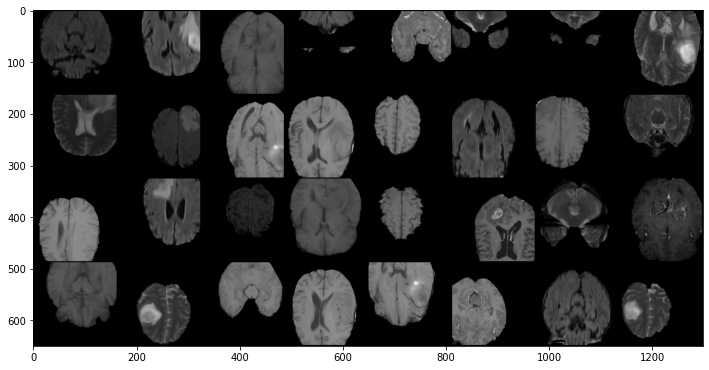

tensor([0, 0, 1, 0, 2, 3, 3, 3, 3, 0, 1, 1, 1, 0, 1, 3, 1, 0, 2, 1, 1, 2, 3, 2,
        1, 3, 1, 1, 1, 2, 0, 3])
['FLAIR', 'FLAIR', 'T1w', 'FLAIR', 'T1gd', 'T2w', 'T2w', 'T2w', 'T2w', 'FLAIR', 'T1w', 'T1w', 'T1w', 'FLAIR', 'T1w', 'T2w', 'T1w', 'FLAIR', 'T1gd', 'T1w', 'T1w', 'T1gd', 'T2w', 'T1gd', 'T1w', 'T2w', 'T1w', 'T1w', 'T1w', 'T1gd', 'FLAIR', 'T2w']


In [ ]:
# DEBUG DATA MODULE
data_module = MRIDataModule(hparams)
data_module.setup()

dataloader = data_module.train_dataloader()
img_batch, tgt_batch = next(iter(dataloader))

img_grid = make_grid(img_batch, normalize=True)

plt.figure(figsize=(12, 12))
plt.imshow(img_grid.permute(1, 2, 0).numpy(), cmap='gray')
plt.show()
print(tgt_batch)
print([RawMRIDataset.MODALITY[tgt.item()] for tgt in tgt_batch])

## Lightning Module
Here, we define the behavior during training, that is what happens with a batch returned by the Dataloader.

The architecture used is EfficientNet, more information in: http://proceedings.mlr.press/v97/tan19a.html



In [ ]:
class MRIMICTutorial(pl.LightningModule):
    def __init__(self, hparams):
        super().__init__()

        self.save_hyperparameters(hparams)

        # Lightweight efficientnet.
        if self.hparams.pretrained:
            self.model = EfficientNet.from_pretrained(self.hparams.model_name,
                                                      num_classes=self.hparams.nout,
                                                      in_channels=self.hparams.nin,
                                                      advprop=True)
        else:
            self.model = EfficientNet.from_name(self.hparams.model_name,
                                                num_classes=self.hparams.nout,
                                                in_channels=self.hparams.nin)
        self.loss = nn.CrossEntropyLoss()
        self.accuracy = Accuracy()

        torchinfo.summary(self.model)

    def forward(self, x):
        # NOTE: Pre trained efficientnet uses a different normalization range.
        # Here we change [0, 1] range from pre processing to [-1, 1]
        if self.hparams.pretrained:
            x = 2*x - 1
        return self.model(x).softmax(dim=-1)

    def classification_step(self, mode, batch):
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss(y_hat, y)

        if mode == "train":
            self.log("loss", loss, on_epoch=True, on_step=True)

            return loss
        elif mode == "val":
            self.accuracy(y_hat, y)
            self.log("val_loss", loss, on_epoch=True, on_step=False, prog_bar=True)
            self.log("val_acc", self.accuracy, on_epoch=True, on_step=False, prog_bar=True)

    def training_step(self, train_batch, batch_idx):
        return self.classification_step("train", train_batch)

    def validation_step(self, val_batch, batch_idx):
        self.classification_step("val", val_batch)

    def configure_optimizers(self):
        optimizer = AdamW(self.model.parameters(), lr=self.hparams.lr, weight_decay=self.hparams.wd)

        return optimizer

## Training

### Training Logs
By default, Pytorch Lightning logs the training results using tensorboard.
You can configure many other loggers (https://pytorch-lightning.readthedocs.io/en/stable/extensions/logging.html), we recommend checking out Neptune or MLFlow!

In [ ]:
%tensorboard --logdir lightning_logs

Reusing TensorBoard on port 6006 (pid 216), started 2:00:07 ago. (Use '!kill 216' to kill it.)

<IPython.core.display.Javascript object>

Use tensorboard to compare experiments! In the example bellow, we are showing faster convergence between using pretrained weights (brown) or not (orange).

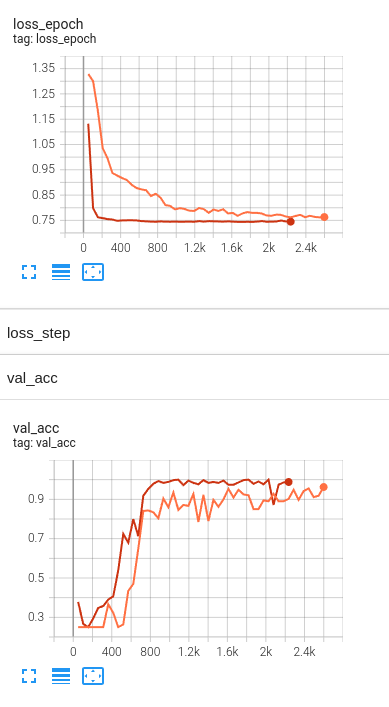

In [ ]:
debug = False  # Turn this True to test the code with a quick run

# Initialization
model = MRIMICTutorial(hparams)
data = MRIDataModule(hparams)

# The PL trainer can run various callbacks during training. Here we only use the
# callback that saves the weights of the trained network.
os.makedirs("logs", exist_ok=True)
checkpoint_callback = [ModelCheckpoint(dirpath="logs",  # path to save checkpoint
                                       filename=hparams["experiment_name"] + "{epoch}-{val_acc:.2f}",
                                       monitor="val_acc",
                                       mode="max")]

trainer = pl.Trainer(max_epochs=hparams["max_epochs"],
                     gpus=1,
                     fast_dev_run=debug,
                     callbacks=checkpoint_callback,
                     log_every_n_steps=1
                     )

print("Hyperparameters:\n")
for k, v in hparams.items():
    print(f'{k}: {v}')

trainer.fit(model, data)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/adv-efficientnet-b0-b64d5a18.pth" to /root/.cache/torch/hub/checkpoints/adv-efficientnet-b0-b64d5a18.pth


  0%|          | 0.00/20.4M [00:00<?, ?B/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:611: UserWarning: Checkpoint directory /content/logs exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name     | Type             | Params
----------------------------------------------
0 | model    | EfficientNet     | 4.0 M 
1 | loss     | CrossEntropyLoss | 0     
2 | accuracy | Accuracy         | 0     
----------------------------------------------
4.0 M     Trainable params
0         Non-trainable params
4.0 M     Total params
16.048    Total estimated model params size (MB)


Loaded pretrained weights for efficientnet-b0
Hyperparameters:

experiment_name: MICTutorial Classification Baseline Pretrained
train_transform_str: crop
eval_transform_str: val_240
max_epochs: 50
batch_size: 32
model_name: efficientnet-b0
pretrained: True
nworkers: 2
nout: 4
nin: 1
lr: 0.0001
wd: 1e-05
cpu: False


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

# **2D Analysis of Results**

Here you will check your validation and test data inference, visualize network output calculate metrics.

## Validation results

Using model logs/MICTutorial Classification Baseline Pretrainedepoch=20-val_acc=1.00.ckpt
Loaded pretrained weights for efficientnet-b0


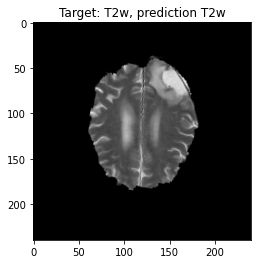

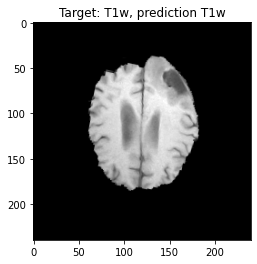

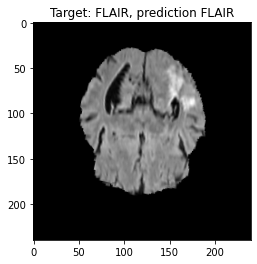

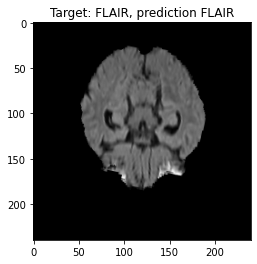

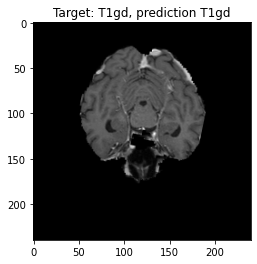

...

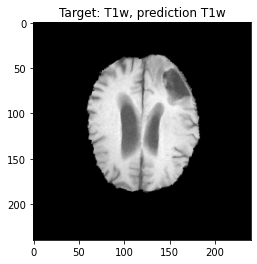

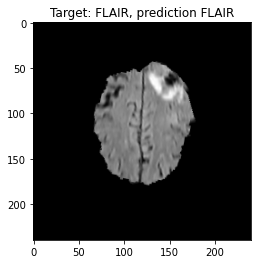

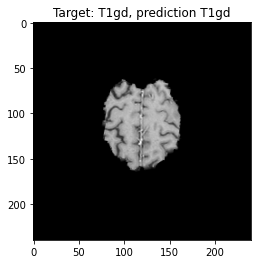

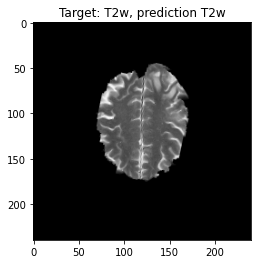

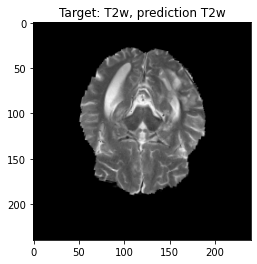

In [ ]:
# WARNING: This will load a random checkpoint from the logs folder, if you want an specific one change it!
baseline_model = random.choice(glob("logs/*.ckpt"))
print(f"Using model {baseline_model}")

# Load trained model
model = MRIMICTutorial.load_from_checkpoint(baseline_model).eval().cuda()

# Initialize test slices
data.hparams.batch_size = 1
val_slices = data.val_dataloader()

def collect_2d_results(slices, model):
    y_trues = []
    y_labels = []
    for i, (slic, tgt) in enumerate(slices):
        with torch.no_grad():
            out = model(slic.cuda()).argmax(dim=-1).item()

        tgt = tgt.item()
        y_trues.append(tgt)
        y_labels.append(out)
        out_str = RawMRIDataset.MODALITY[out]
        tgt_str = RawMRIDataset.MODALITY[tgt]

        if i % 10 == 0:
            plt.imshow(slic.squeeze(), cmap="gray")
            plt.title(f"Target: {tgt_str}, prediction {out_str}")
            plt.show()

    return y_trues, y_labels

y_trues_val, y_labels_val = collect_2d_results(val_slices, model)


## Classification Metrics
Here we analyze our results through traditional classification metrics and a confusion matrix. The provided function will do them and save results in the provided metrics_dir!

In [ ]:
def standardized_classification_metrics(y_labels: List[int],
                                        y_trues: List[int],
                                        version: str = None,
                                        metrics_dir: str = None,
                                        mode: str = "test",
                                        labels: List[str] = ["NEGATIVE", "POSITIVE"],
                                        int_labels: List[int] = [0, 1],
                                        f1_average: str = "binary",
                                        display_plots: bool = False) -> Dict:
    '''
    A function for classification metrics
    '''
    metric_report = {}

    true_f1 = round(f1_score(y_trues, y_labels, average=f1_average), 4)
    true_acc = round(accuracy_score(y_trues, y_labels), 4)

    cla_report = classification_report(y_trues, y_labels, target_names=labels, labels=int_labels, output_dict=True)

    metric_report["F1"] = true_f1
    metric_report["ACC"] = true_acc
    metric_report.update(cla_report)

    if metrics_dir is not None:
        print(f"Targets: {y_trues}")
        print(f"Predictions: {y_labels}")
        print(f"F1: {true_f1}, ACC: {true_acc}")
        os.makedirs(metrics_dir, exist_ok=True)

        # Save numeric metrics
        with open(os.path.join(metrics_dir, f"{mode}_{version}_metrics.json"), 'w') as json_metrics:
            json.dump(metric_report, json_metrics)

        # Confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_trues, y_labels, labels=int_labels),
                                      display_labels=labels)

        fig = disp.plot(ax=None).figure_
        plt.savefig(os.path.join(metrics_dir, f"{mode}_{version}_confusion.pdf"), dpi=1000)
        if display_plots:
            plt.show()

    return metric_report

Targets: [3, 0, 3, 2, 0, 2, 0, 1, 3, 0, 1, 0, 0, 0, 1, 0, 1, 2, 0, 0, 0, 2, 3, 2, 3, 0, 2, 2, 1, 3, 0, 3, 2, 3, 2, 2, 2, 0, 0, 2, 2, 0, 3, 0, 2, 3, 3, 1, 2, 2, 2, 1, 1, 3, 3, 2, 1, 2, 1, 2, 3, 1, 1, 0, 1, 1, 0, 3, 0, 1, 3, 3, 2, 1, 1, 1, 1, 1, 3, 1, 2, 1, 0, 0, 2, 2, 1, 0, 3, 2, 0, 0, 2, 3, 3, 0, 2, 0, 0, 3, 1, 3, 0, 3, 3, 2, 3, 3, 2, 2, 3, 1, 0, 3, 2, 3, 0, 0, 3, 3, 1, 3, 2, 3, 2, 0, 2, 1, 1, 3, 1, 2, 3, 3, 3, 3, 1, 2, 3, 3, 1, 3, 0, 0, 1, 3, 3, 3, 1, 3, 1, 3, 0, 3, 0, 2, 3, 1, 0, 1, 0, 2, 2, 1, 2, 1, 1, 0, 0, 3, 0, 3, 3, 0, 1, 0, 0, 1, 2, 0, 1, 2, 3, 0, 0, 3, 0, 3, 0, 2, 0, 2, 3, 3, 1, 1, 0, 1, 0, 0, 3, 1, 0, 1, 3, 3, 0, 1, 1, 1, 0, 1, 0, 0, 2, 2, 2, 3, 0, 1, 0, 0, 1, 2, 3, 1, 2, 1, 2, 3, 0, 2, 3, 3, 2, 1, 0, 0, 0, 3, 0, 1, 1, 2, 0, 2, 0, 3, 0, 1, 3, 3, 3, 2, 3, 3, 2, 2, 3, 0, 2, 1, 2, 1, 1, 3, 1, 0, 1, 0, 0, 0, 1, 2, 3, 2, 3, 2, 0, 1, 1, 1, 2, 0, 0, 1, 3, 2, 3, 2, 3, 3, 1, 0, 0, 1, 2, 2, 3, 2, 2, 3, 2, 2, 1, 1, 0, 2, 3, 2, 0, 3, 2, 1, 2, 3, 1, 3, 2, 1, 1, 3, 2, 1, 2, 1, 2, 1, 3, 3, 

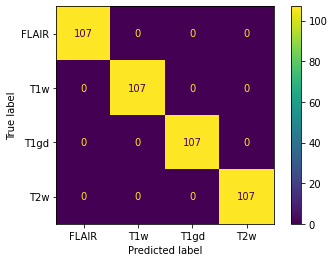

In [ ]:
val_metric_report = standardized_classification_metrics(y_labels_val,
                                                        y_trues_val,
                                                        version=model.hparams.experiment_name,
                                                        metrics_dir="metrics",
                                                        mode="val",
                                                        labels=RawMRIDataset.MODALITY,
                                                        int_labels=list(range(4)),
                                                        f1_average="macro",
                                                        display_plots=True)

In [ ]:
for k, v in val_metric_report.items():
    print(f"{k}: {v}")

F1: 1.0
ACC: 1.0
FLAIR: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107}
T1w: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107}
T1gd: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107}
T2w: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107}
accuracy: 1.0
macro avg: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 428}
weighted avg: {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 428}


## Test metrics
This will be our final test. You shouldn't use test data for tuning your model. The test set is used for a final comparison usually with other methodologies, using your methodology fixed using validation.

Using model logs/MICTutorial Classification Baseline Pretrainedepoch=20-val_acc=1.00.ckpt
Loaded pretrained weights for efficientnet-b0


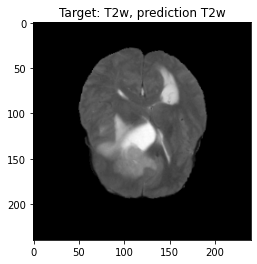

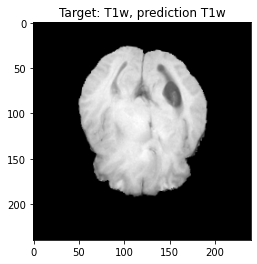

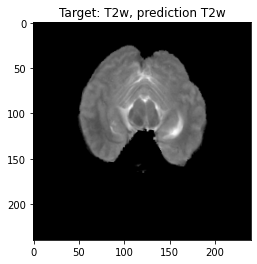

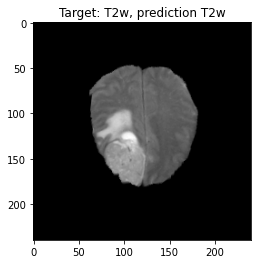

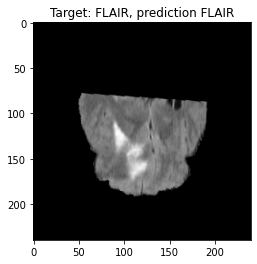

...

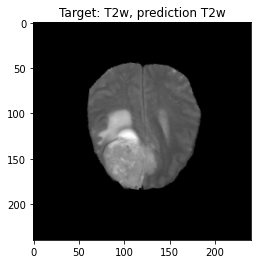

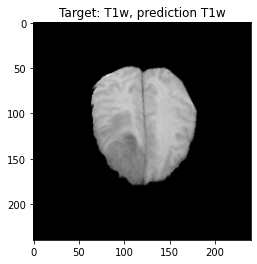

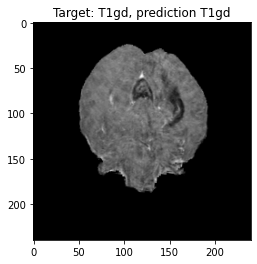

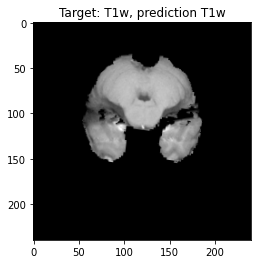

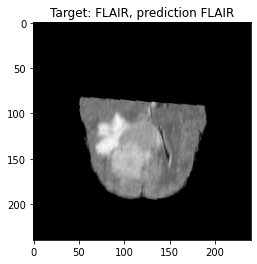

In [ ]:
# WARNING: This will load a random checkpoint from the logs folder, if you want an specific one change it!
baseline_model = random.choice(glob("logs/*.ckpt"))
print(f"Using model {baseline_model}")

# Load trained model
model = MRIMICTutorial.load_from_checkpoint(baseline_model).eval().cuda()

# Initialize test slices
data.hparams.batch_size = 1
test_slices = data.test_dataloader()

y_trues_test, y_labels_test = collect_2d_results(test_slices, model)


Targets: [3, 2, 1, 2, 2, 0, 0, 3, 1, 1, 1, 3, 1, 1, 3, 1, 3, 2, 1, 2, 3, 1, 1, 2, 1, 0, 3, 0, 3, 0, 3, 3, 3, 1, 1, 2, 3, 2, 2, 2, 0, 1, 2, 2, 1, 0, 2, 1, 0, 1, 1, 0, 2, 1, 2, 3, 1, 1, 3, 3, 3, 3, 1, 3, 0, 2, 1, 3, 3, 0, 1, 1, 0, 0, 3, 2, 3, 3, 0, 1, 3, 2, 2, 1, 0, 0, 1, 0, 0, 1, 1, 2, 3, 0, 1, 1, 0, 2, 2, 3, 3, 2, 3, 1, 2, 1, 2, 1, 2, 3, 1, 3, 3, 2, 2, 1, 3, 2, 2, 1, 3, 2, 2, 3, 0, 2, 0, 1, 2, 2, 3, 1, 0, 2, 0, 2, 0, 0, 0, 2, 0, 3, 3, 0, 3, 0, 3, 1, 1, 1, 0, 2, 2, 1, 0, 1, 3, 1, 1, 0, 0, 3, 1, 1, 2, 1, 2, 0, 0, 3, 1, 0, 1, 0, 2, 2, 2, 1, 1, 0, 3, 3, 3, 2, 1, 2, 2, 0, 0, 0, 0, 1, 3, 1, 0, 1, 3, 3, 1, 0, 2, 1, 2, 1, 0, 2, 2, 3, 0, 2, 0, 1, 0, 1, 3, 3, 0, 0, 1, 0, 2, 0, 2, 0, 0, 0, 1, 2, 3, 1, 1, 3, 1, 0, 1, 3, 2, 3, 2, 1, 0, 3, 2, 2, 2, 0, 1, 0, 1, 2, 3, 3, 1, 2, 3, 0, 1, 0, 0, 0, 0, 3, 1, 2, 3, 2, 3, 0, 2, 3, 3, 0, 0, 2, 3, 0, 3, 3, 1, 2, 2, 2, 0, 2, 0, 2, 0, 1, 2, 3, 2, 3, 1, 2, 0, 2, 2, 3, 2, 1, 1, 2, 2, 1, 1, 2, 3, 3, 3, 3, 3, 1, 3, 1, 3, 1, 0, 1, 0, 2, 0, 2, 1, 0, 2, 2, 2, 1, 3, 0, 

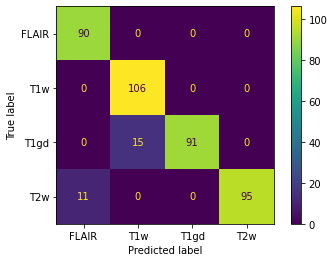

In [ ]:
test_metric_report = standardized_classification_metrics(y_labels_test,
                                                         y_trues_test,
                                                         version=model.hparams.experiment_name,
                                                         metrics_dir="metrics",
                                                         mode="test",
                                                         labels=RawMRIDataset.MODALITY,
                                                         int_labels=list(range(4)),
                                                         f1_average="macro",
                                                         display_plots=True)

In [ ]:
for k, v in test_metric_report.items():
    print(f"{k}: {v}")

F1: 0.9364
ACC: 0.9363
FLAIR: {'precision': 0.8910891089108911, 'recall': 1.0, 'f1-score': 0.9424083769633509, 'support': 90}
T1w: {'precision': 0.8760330578512396, 'recall': 1.0, 'f1-score': 0.9339207048458149, 'support': 106}
T1gd: {'precision': 1.0, 'recall': 0.8584905660377359, 'f1-score': 0.9238578680203046, 'support': 106}
T2w: {'precision': 1.0, 'recall': 0.8962264150943396, 'f1-score': 0.9452736318407959, 'support': 106}
accuracy: 0.9362745098039216
macro avg: {'precision': 0.9417805416905327, 'recall': 0.9386792452830189, 'f1-score': 0.9363651454175665, 'support': 408}
weighted avg: {'precision': 0.9437684410152245, 'recall': 0.9362745098039216, 'f1-score': 0.9361281559451828, 'support': 408}


Noticed how our performance went down significantly in the test set!

This shows the importance of validating in different data. Since our dataset is very limited, that is to be expected.

We have chosen our best model using slices from the validation volume. It does perform well in the validation volume but performs degrades when using test slices from another patient.



# 3D Analysis of Results
We have analysed results slice wise, however, a pratical application of this network would probably be used to classify the modality of a whole volume. Lets check how it would perform by classifying a whole volume through majority voting.

## Validation

In [ ]:
# WARNING: This will load a random checkpoint from the logs folder, if you want an specific one change it!
baseline_model = random.choice(glob("logs/*.ckpt"))
print(f"Using model {baseline_model}")

# Load trained model
model = MRIMICTutorial.load_from_checkpoint(baseline_model).eval().cuda()

val_data_4d = RawMRIDataset("val", transform=MinMaxNormalize())


def collect_3d_results(data_4d, model):
    y_trues = []
    y_labels = []
    for vol, meta in data_4d:
        # Iterate over 3D modalities in 4D volume
        for modality_vol, (modality_tgt, modality_tgt_str) in zip(vol, enumerate(RawMRIDataset.MODALITY)):
            modality_votes = []

            # Label is current modality we are slicing
            y_trues.append(modality_tgt)
            for i, modality_slice in enumerate(modality_vol):

                # Skip empty slices in the same way we pre processed before
                image_area = modality_slice.shape[0]*modality_slice.shape[1]
                if (modality_slice > 0).sum() > image_area*0.1:
                    model_input = torch.from_numpy(modality_slice).unsqueeze(0).unsqueeze(0)
                    with torch.no_grad():
                        y_hat = model(model_input.cuda()).cpu().argmax(dim=-1).item()
                        modality_votes.append(y_hat)
                        y_hat_str = RawMRIDataset.MODALITY[y_hat]

            # Get the prediction with most votes and print some stats
            n_votes = len(modality_votes)
            n_slices = modality_vol.shape[0]
            modality_votes_count = Counter(modality_votes)
            print(f"Number of slices considered: {n_votes} out of {n_slices}")
            print(f"Modality votes: {modality_votes_count}")
            print(f"Target: {modality_tgt}, {modality_tgt_str}")
            majority = modality_votes_count.most_common(1)[0][0]
            print(f"Majority voting result: {majority}\n")
            y_labels.append(majority)

    return y_trues, y_labels

val_y_trues_3d, val_y_labels_3d = collect_3d_results(val_data_4d, model)

Using model logs/MICTutorial Classification Baseline Pretrainedepoch=20-val_acc=1.00.ckpt
Loaded pretrained weights for efficientnet-b0
Number of slices considered: 107 out of 155
Modality votes: Counter({0: 107})
Target: 0, FLAIR
Majority voting result: 0

Number of slices considered: 107 out of 155
Modality votes: Counter({1: 107})
Target: 1, T1w
Majority voting result: 1

Number of slices considered: 107 out of 155
Modality votes: Counter({2: 107})
Target: 2, T1gd
Majority voting result: 2

Number of slices considered: 107 out of 155
Modality votes: Counter({3: 107})
Target: 3, T2w
Majority voting result: 3



Targets: [0, 1, 2, 3]
Predictions: [0, 1, 2, 3]
F1: 1.0, ACC: 1.0


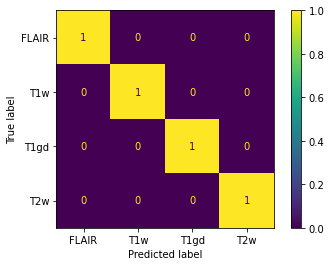

In [ ]:
val_metric_report_3d = standardized_classification_metrics(val_y_labels_3d,
                                                           val_y_trues_3d,
                                                           version=model.hparams.experiment_name + '3d',
                                                           metrics_dir="metrics",
                                                           mode="val",
                                                           labels=RawMRIDataset.MODALITY,
                                                           int_labels=list(range(4)),
                                                           f1_average="macro",
                                                           display_plots=True)

## Test

In [ ]:
# WARNING: This will load a random checkpoint from the logs folder, if you want an specific one change it!
baseline_model = random.choice(glob("logs/*.ckpt"))
print(f"Using model {baseline_model}")

# Load trained model
model = MRIMICTutorial.load_from_checkpoint(baseline_model).eval().cuda()

test_data_4d = RawMRIDataset("test", transform=MinMaxNormalize())

test_y_trues_3d, test_y_labels_3d = collect_3d_results(test_data_4d, model)

Using model logs/MICTutorial Classification Baseline Pretrainedepoch=20-val_acc=1.00.ckpt
Loaded pretrained weights for efficientnet-b0
Number of slices considered: 90 out of 155
Modality votes: Counter({0: 90})
Target: 0, FLAIR
Majority voting result: 0

Number of slices considered: 106 out of 155
Modality votes: Counter({1: 106})
Target: 1, T1w
Majority voting result: 1

Number of slices considered: 106 out of 155
Modality votes: Counter({2: 91, 1: 15})
Target: 2, T1gd
Majority voting result: 2

Number of slices considered: 106 out of 155
Modality votes: Counter({3: 95, 0: 11})
Target: 3, T2w
Majority voting result: 3



Targets: [0, 1, 2, 3]
Predictions: [0, 1, 2, 3]
F1: 1.0, ACC: 1.0


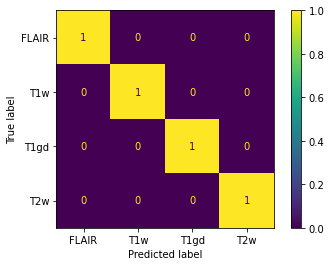

In [ ]:
test_metric_report_3d = standardized_classification_metrics(test_y_labels_3d,
                                                            test_y_trues_3d,
                                                            version=model.hparams.experiment_name + '3d',
                                                            metrics_dir="metrics",
                                                            mode="test",
                                                            labels=RawMRIDataset.MODALITY,
                                                            int_labels=list(range(4)),
                                                            f1_average="macro",
                                                            display_plots=True)

Notice that even though the model didn't perform well in a slice-wise evaluation, majority voting was still enough to correctly predict each modality present on the test set, volume wise.

All metrics and logs are saved locally (Colab will delete it when you stop using this instance):


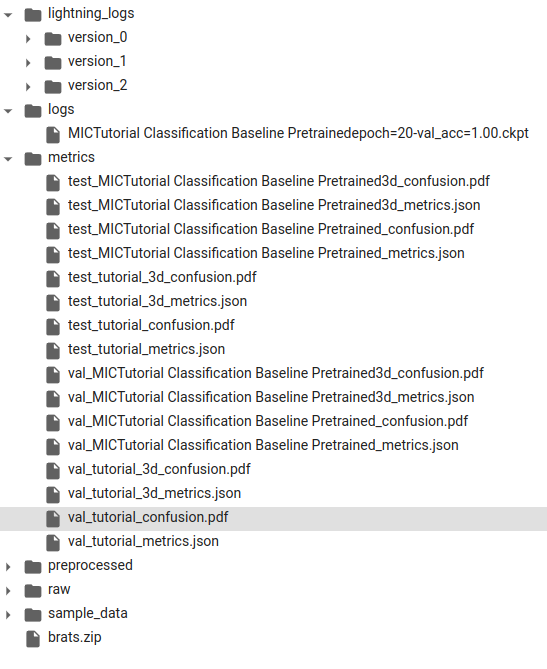